#### Imports

In [1]:
import numpy as np
import pandas as pd
from scipy.stats import kendalltau
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import OrderedDict
import os
import skimage.io as skio

#### Constants

In [2]:
dict_metrics = {
    'tpr': 'TPR, Recall, Sensitivity',
    'tnr': 'TNR, Specificity, Selectivity',
    'fpr': 'FPR',
    'fnr': 'FNR, Miss rate',
    'mpr': 'May positive rate (MPR)',
    'mnr': 'May negative rate (MNR)',
    'f1': 'F1',
    'precision': 'Precision',
    'edge_coherence': 'Edge coherence',
    'accuracy_must_may': 'Accuracy (ignoring cannot)'
}
dict_models = OrderedDict([
    ('e84a8b06', 'm'),
    ('b0a3ff6a', 'ms'),
    ('5a53032f', 'msd'),
    ('0575609e', 'pseudo, msd'),
    ('90fa5734', 'msd, dada, pseudo'),
    ('34e84fe9', 'pseudo, msd, dada'),
    ('ae98d8ee', 'dada, pseudo, msd'),
    ('23ad5382', 'pseudo, dada, msd'),
    ('c4721ec4', 'dada, msd'),
    ('d7118205', 'msd_spade'),
    ('0da9669d', 'msd_spade, pseudo'),
    ('9a8fcb11', 'msd_spade, pseudo'),
    ('8051ea3a', 'dada, msd_spade'),
    ('49167587', 'trash, dada, msd_spade, pseudo'),
])

## Functions

#### boxplot_metric

In [3]:
def boxplot_metric(df, metric, do_stripplot=False, **snskwargs):
    f = plt.figure(dpi=300)
    
    if do_stripplot:
        ax = sns.boxplot(x='model', y=metric, data=df, fliersize=0., **snskwargs)
        ax = sns.stripplot(x='model', y=metric, data=df, size=2., color='gray', **snskwargs)
    else:
        ax = sns.boxplot(x='model', y=metric, data=df, **snskwargs)
    
    # Set X-label
    ax.set_xlabel('Models', rotation=0, fontsize='medium');
    
    # Set Y-label
    ax.set_ylabel(dict_metrics[metric], rotation=90, fontsize='medium');
    
    # Change spines
    sns.despine(left=True, bottom=True)
    
    # Change X-Tick labels
    xticklabels = [dict_models[t.get_text()] for t in ax.get_xticklabels()]
    ax.set_xticklabels(xticklabels, 
                       rotation=20, 
                       verticalalignment='top',
                       horizontalalignment='right',
                       fontsize='xx-small');

    
#     # Remove legend
#     ax.get_legend().remove()

#     # Set x-axis limits
#     set_xaxis(ax, x_min=-0.5, x_max=19.5, step=1., fontsize='small')

#     # Vertical grid lines
#     ax.grid(b=True, axis='x', which='major')
#     ax.tick_params(axis='x', which='both',length=0)

    return ax

#### heatmap_kendall

In [4]:
def heatmap_kendall(data_dict, metric, models, **snskwargs):
    f = plt.figure(dpi=300)
    ax = sns.heatmap(dict_kendall_mat[metric], linewidths=.5)
    
    # Set axis labels
    ax.set_xlabel(None);
    ax.set_ylabel(None);
    
    # Change X-Tick labels
    ax.set_xticklabels(models, 
                       rotation=20, 
                       verticalalignment='top',
                       horizontalalignment='right',
                       fontsize='xx-small');
    ax.set_yticklabels(models,
                       rotation=0, 
                       fontsize='xx-small');
    
    ax.set_title(dict_metrics[metric])

    
#     # Remove legend
#     ax.get_legend().remove()

#     # Set x-axis limits
#     set_xaxis(ax, x_min=-0.5, x_max=19.5, step=1., fontsize='small')

#     # Vertical grid lines
#     ax.grid(b=True, axis='x', which='major')
#     ax.tick_params(axis='x', which='both',length=0)

    return ax

# Read data

#### Read DataFrame of each model

In [5]:
models_paths = list(Path('./data').glob('*'))
models_df = {m.name.split('--')[1]: pd.read_csv(m.joinpath('eval_masker.csv'), index_col=False) 
             for m in models_paths}
for k, v in models_df.items():
    v['model'] = [k] * len(v)

#### Concatenate DataFrames

In [6]:
df = pd.concat(list(models_df.values()), ignore_index=True)

#### Update dict of models

In [7]:
models = df.model.unique()
remove_keys = set(dict_models.keys()).difference(set(models))
for m in remove_keys:
    dict_models.pop(m)

## Filter

### Determine images with high metrics in all models

In [9]:
tpr_th = 0.95
fpr_th = 0.05
acc_th = 0.5
edgec_th = 0.02

In [11]:
idx_good_in_all = []
for idx in df.idx.unique():
    df_th = df.loc[(df.tpr >= tpr_th) &\
                   (df.fpr <= fpr_th) &\
                   (df.accuracy_must_may >= acc_th) &\
                   (df.idx == idx) &\
                   (df.model.isin(models))]
    if len(df_th) == len(models):
        idx_good_in_all.append(idx)
print(len(idx_good_in_all))
idx_not_good_in_all = list(set(df.idx.unique()).difference(idx_good_in_all))

82


### Determine images with low metrics in any model

In [8]:
tpr_th = 0.95
fpr_th = 0.05
edgec_th = 0.05

In [9]:
idx_not_good_in_any = []
for idx in df.idx.unique():
    df_th = df.loc[((df.tpr <= tpr_th) |\
                    (df.fpr >= fpr_th) |\
                    (df.edge_coherence >= edgec_th)) &\
                   ((df.idx == idx) &\
                    (df.model.isin(models)))]
    if len(df_th) > 0:
        idx_not_good_in_any.append(idx)
print(len(idx_not_good_in_any))

25


#### Plot 

In [14]:
data_path = '/home/alex/Dropbox/ccai/data/'
imgs_orig_path = os.path.join(data_path, 'floodmasks_eval/imgs')

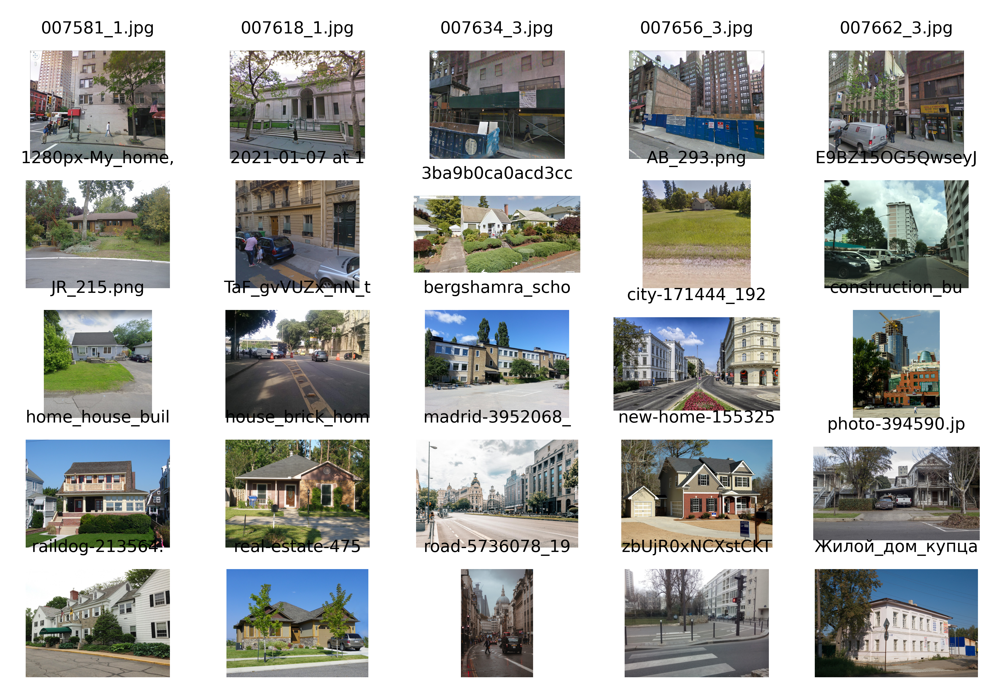

In [31]:
n_cols = 5
n_rows = len(idx_failed) // n_cols
f, axes = plt.subplots(n_rows, n_cols, dpi=800)

idx = 0
for r in range(n_rows):
    for c in range(n_cols):
        filename = df.loc[df.idx == idx_not_good_in_any[idx], 'filename'].values[0]
        axes[r, c].imshow(skio.imread(os.path.join(imgs_orig_path, filename)))
        axes[r, c].axis('off');
        axes[r, c].set_title(filename[:15], fontsize='xx-small')
        idx += 1

In [32]:
f.savefig('images_low_metrics_any_model.png', dpi=f.dpi)

# Plot

## Boxplots

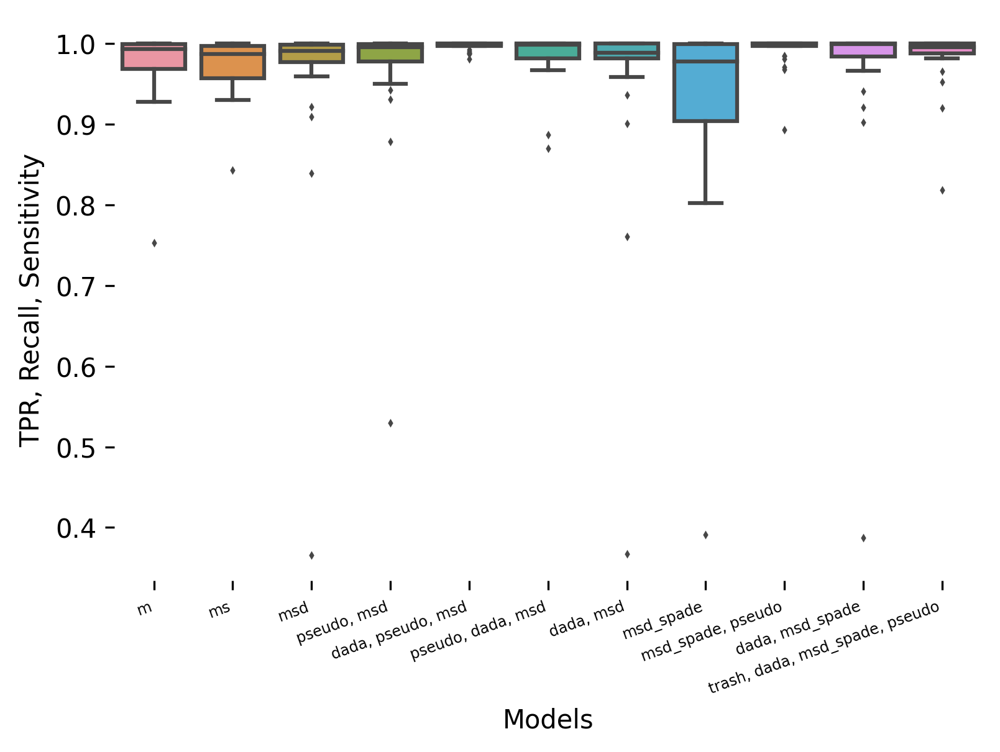

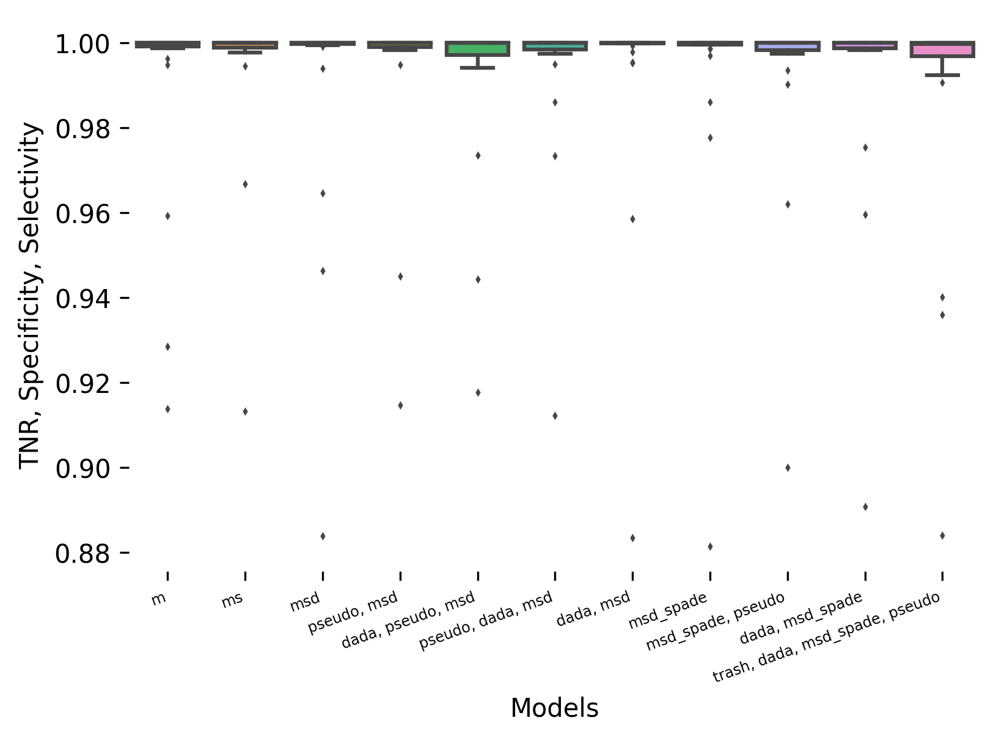

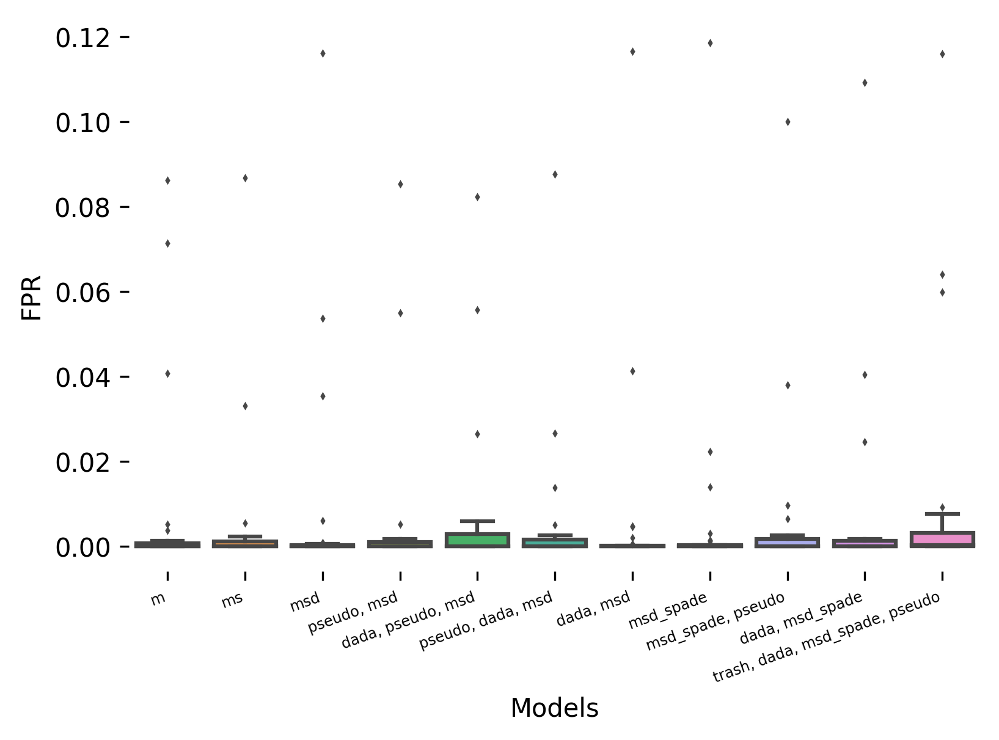

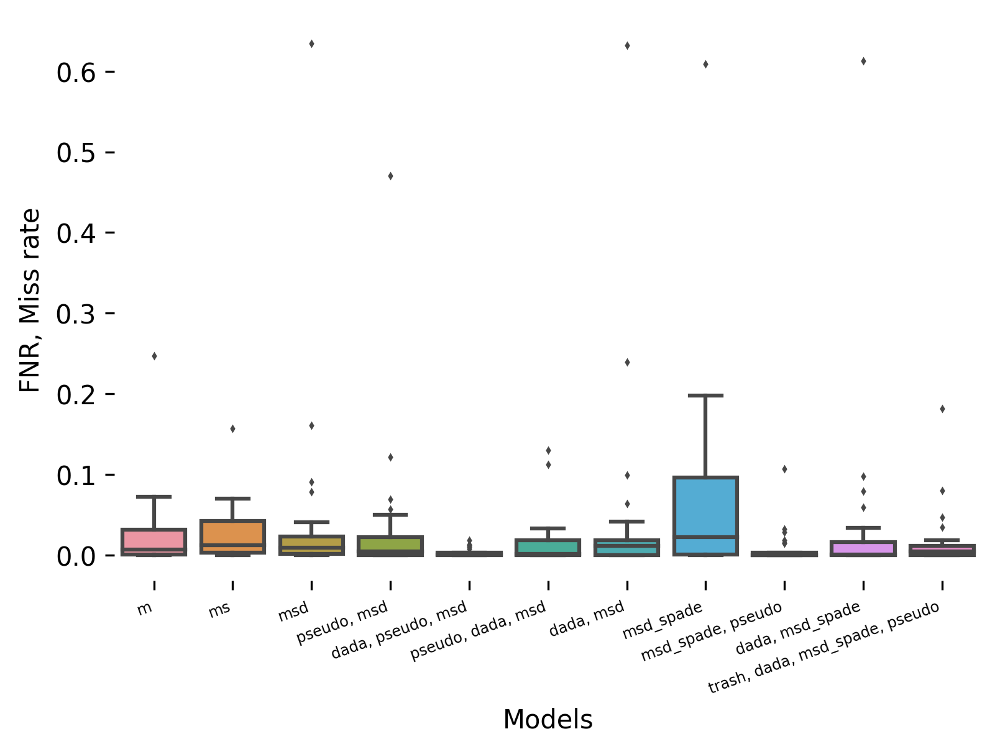

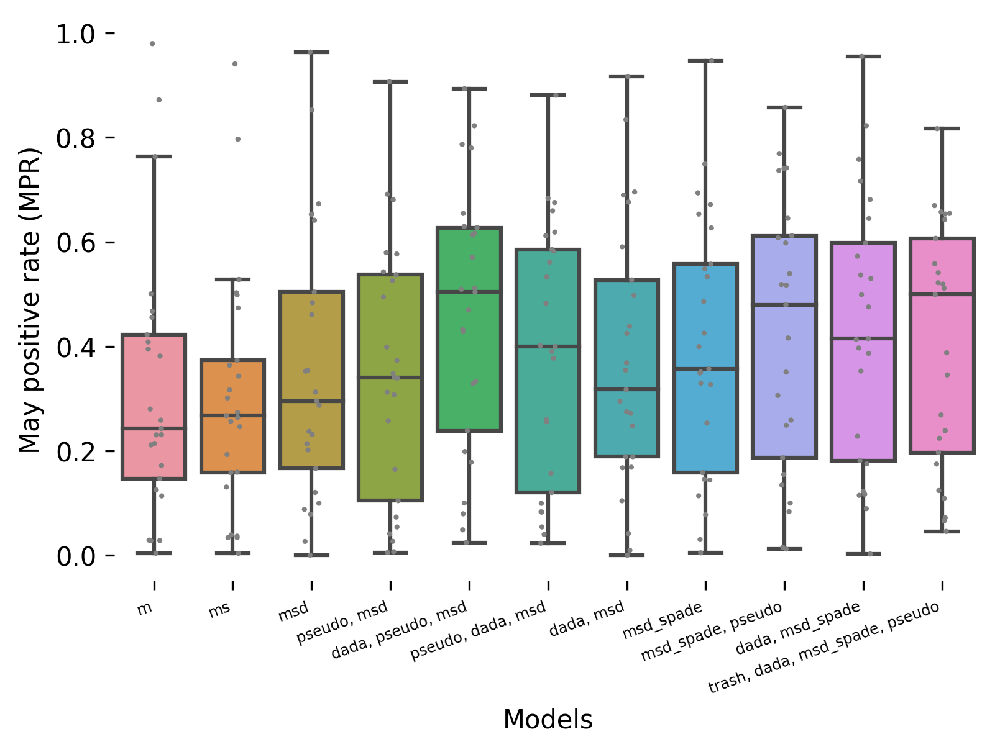

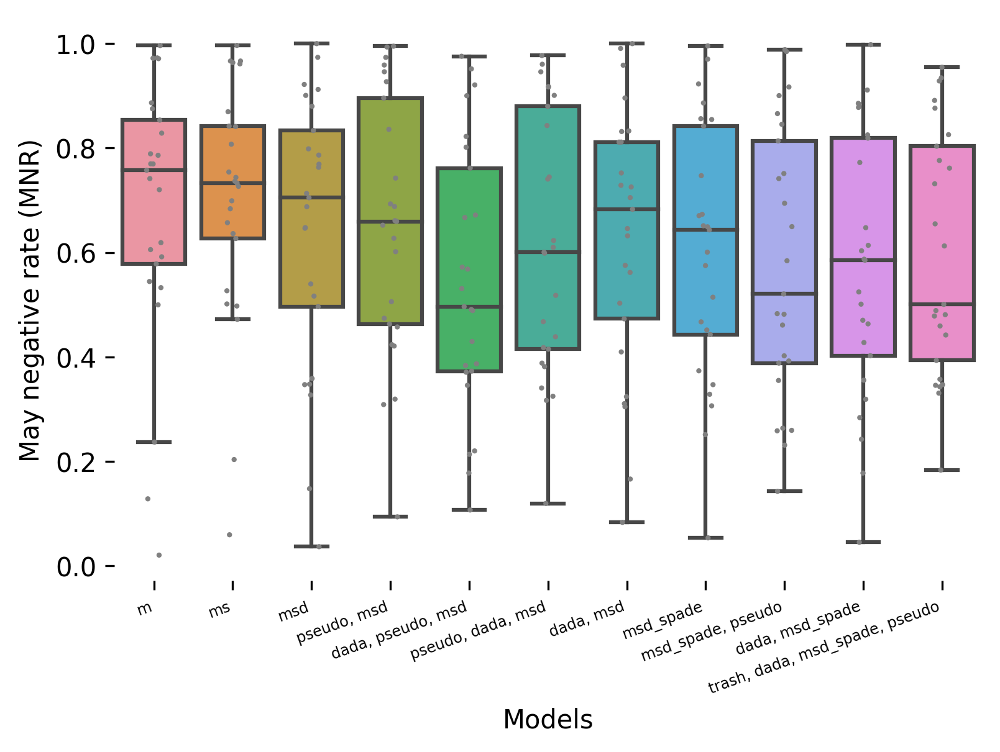

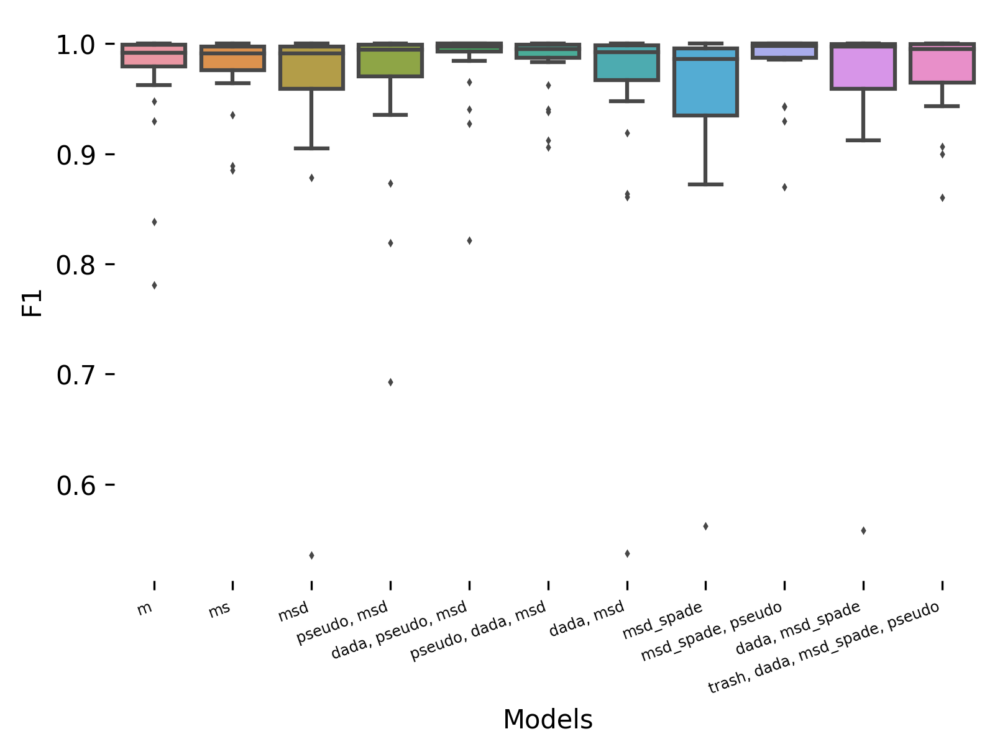

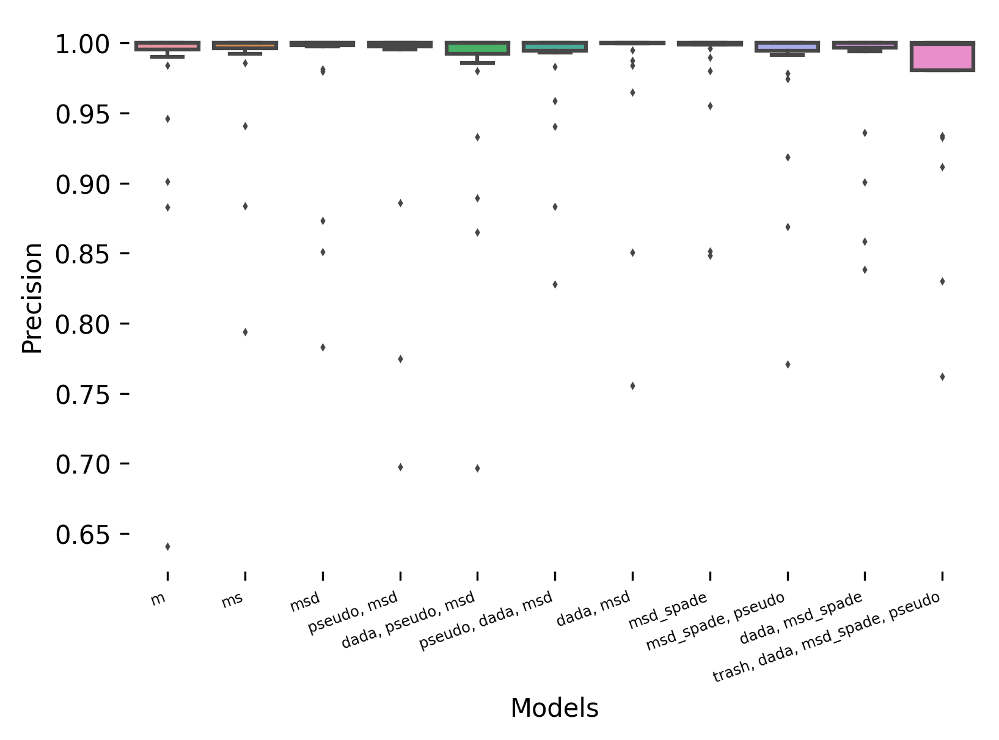

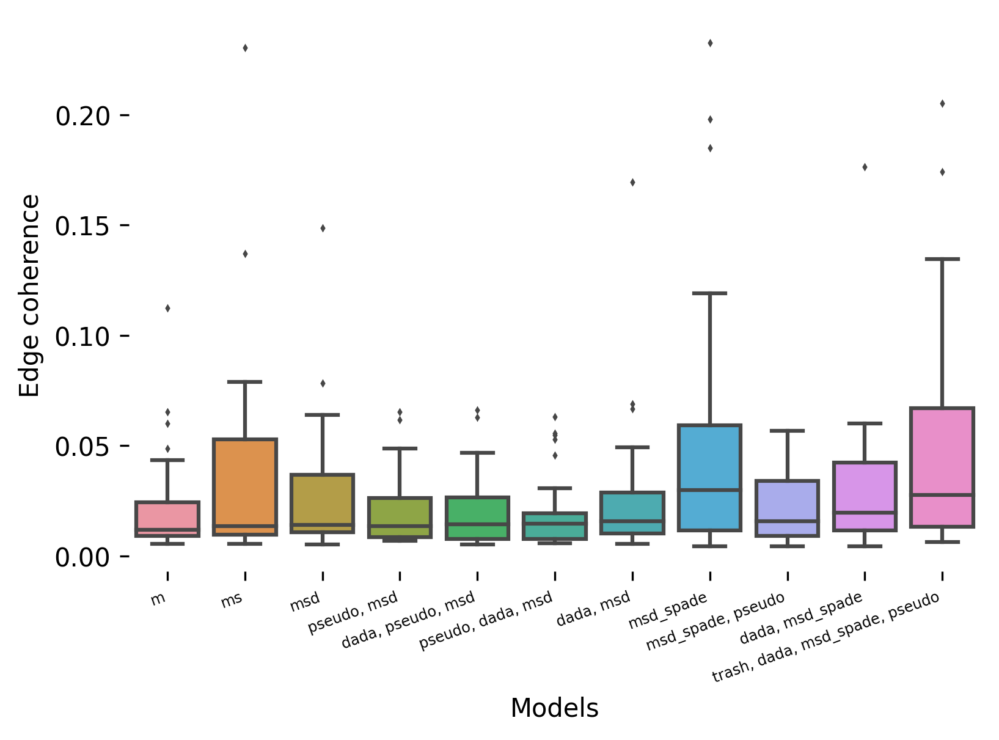

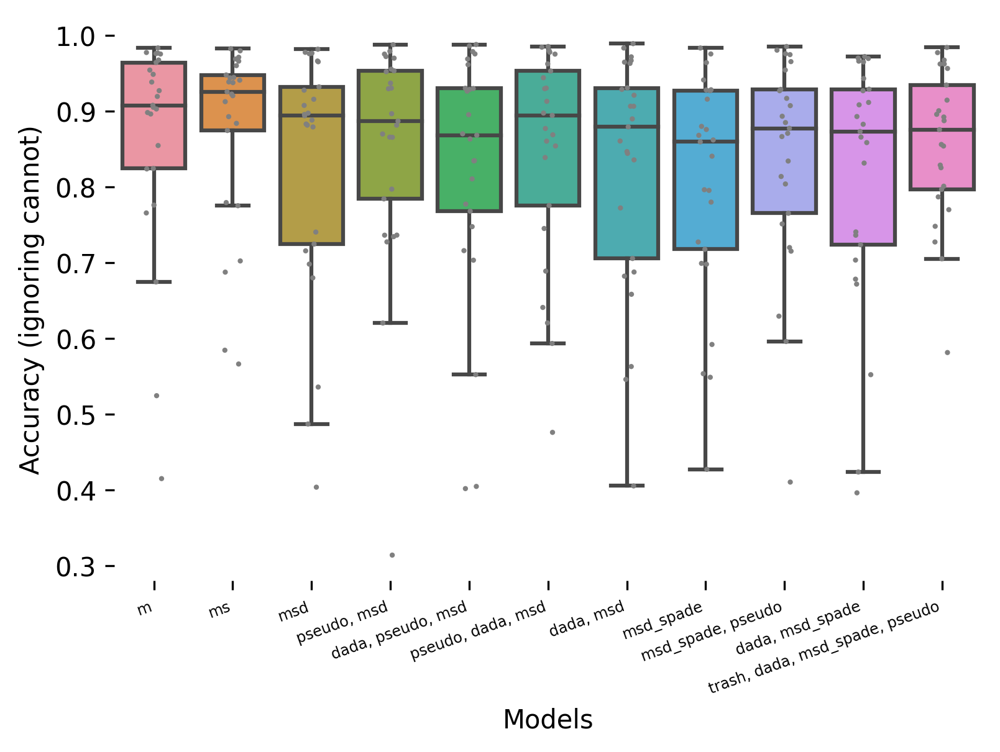

In [36]:
# filter_idx = df.idx.unique()
# filter_idx = idx_not_good_in_all
filter_idx = idx_not_good_in_any

for m in dict_metrics.keys():
    if m in ['mnr', 'mpr', 'accuracy_must_may']:
        boxplot_metric(df.loc[df.idx.isin(filter_idx)], metric=m, 
                       do_stripplot=True, order=list(dict_models.keys()))
    else:
        boxplot_metric(df.loc[df.idx.isin(filter_idx)], metric=m, 
                       fliersize=1., order=list(dict_models.keys()))

## Kendall correlation

In [51]:
n_models = len(dict_models.keys())
dict_kendall_mat = {metric: np.zeros([n_models, n_models]) for metric in dict_metrics.keys()}
dict_kendallp_mat = {metric: np.zeros([n_models, n_models]) for metric in dict_metrics.keys()}

In [57]:
# filter_idx = df.idx.unique()
# filter_idx = idx_not_good_in_all
filter_idx = idx_not_good_in_any

for metric in dict_kendall_mat.keys():
    for idx_i, m_i in enumerate(dict_models.keys()):
        for idx_j, m_j in enumerate(dict_models.keys()):
            v_m_i = df.loc[(df.model == m_i) & df.idx.isin(filter_idx), metric].argsort().values
            v_m_j = df.loc[(df.model == m_j) & df.idx.isin(filter_idx), metric].argsort().values
            corr, pval = kendalltau(v_m_i, v_m_j)
            dict_kendall_mat[metric][idx_i, idx_j] = corr
            dict_kendallp_mat[metric][idx_i, idx_j] = pval

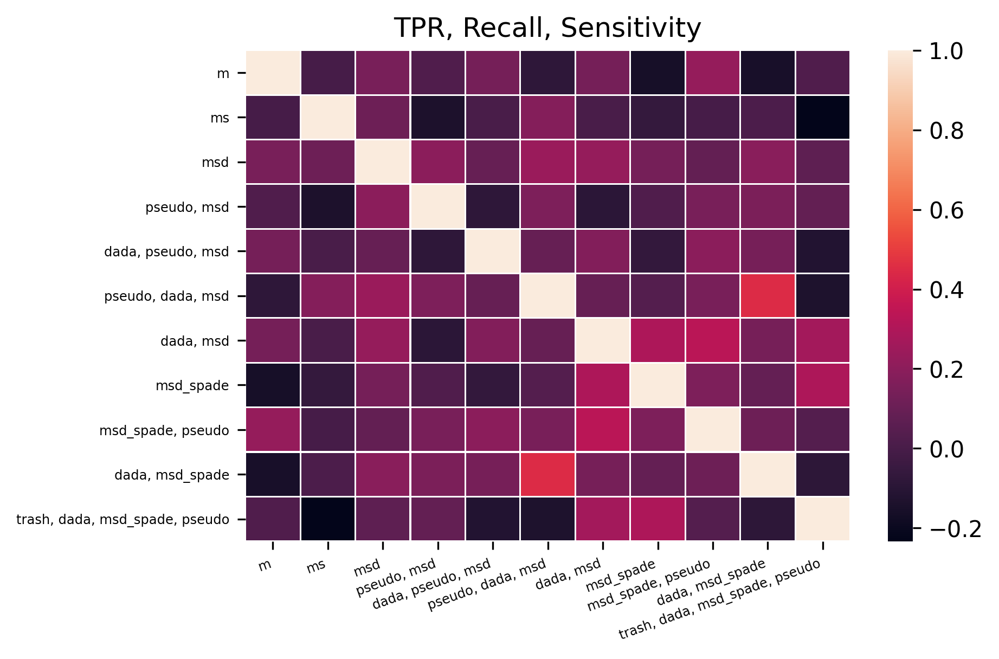

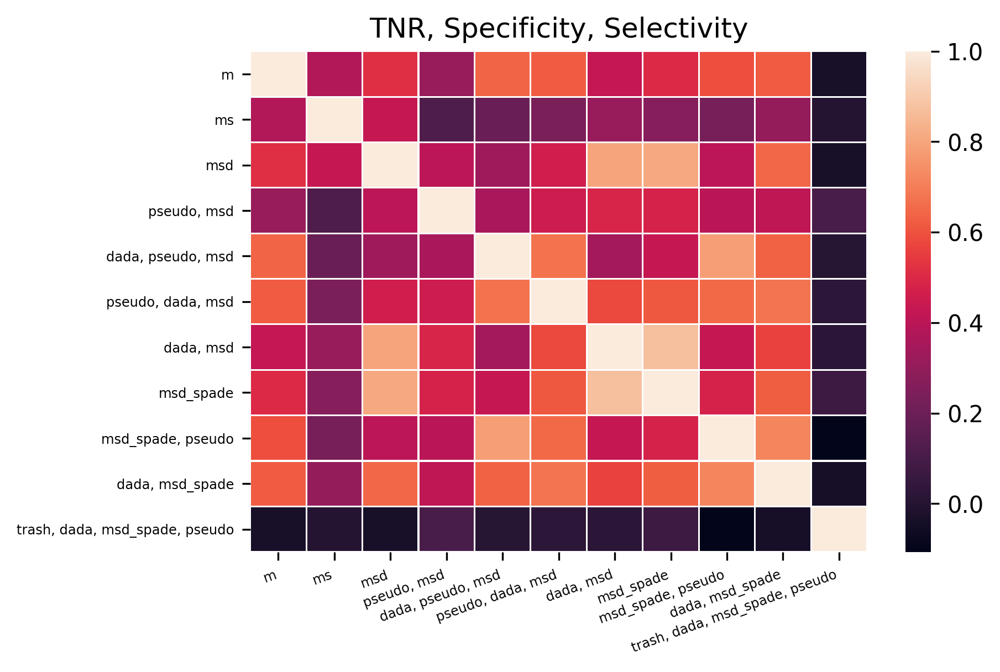

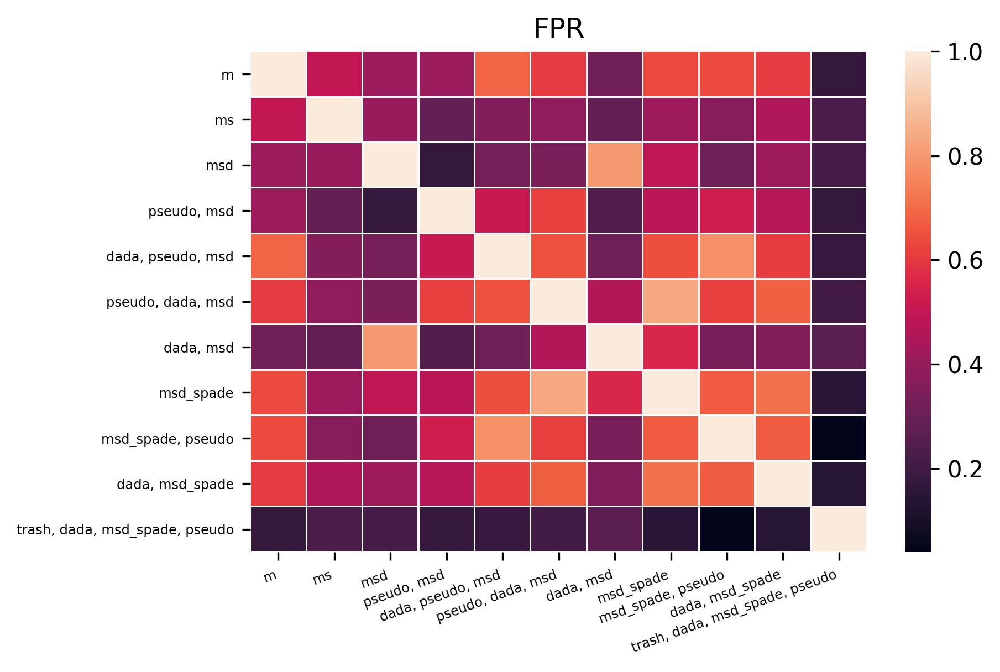

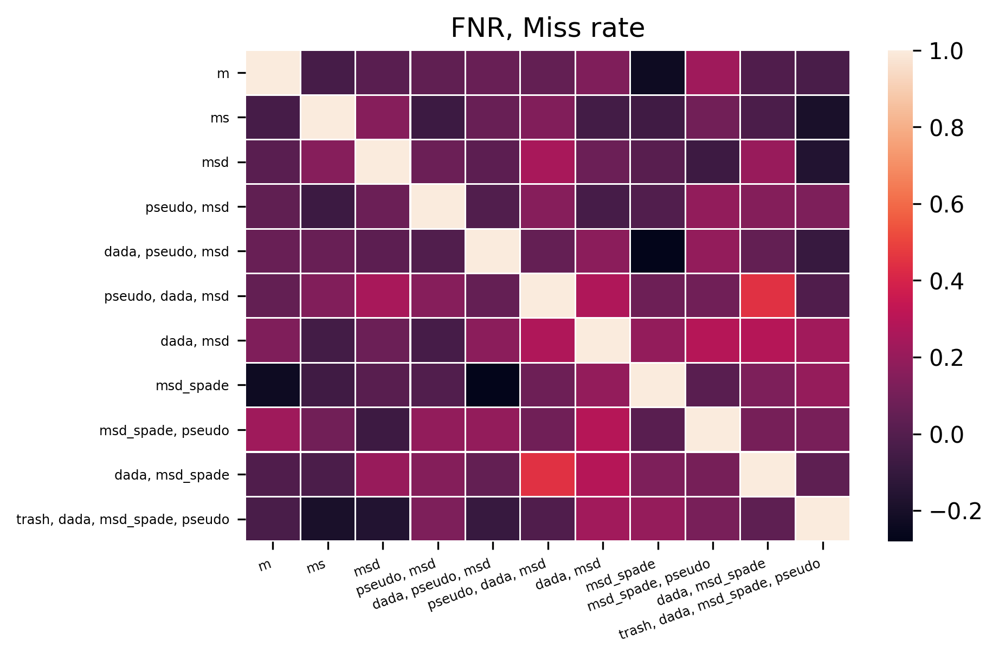

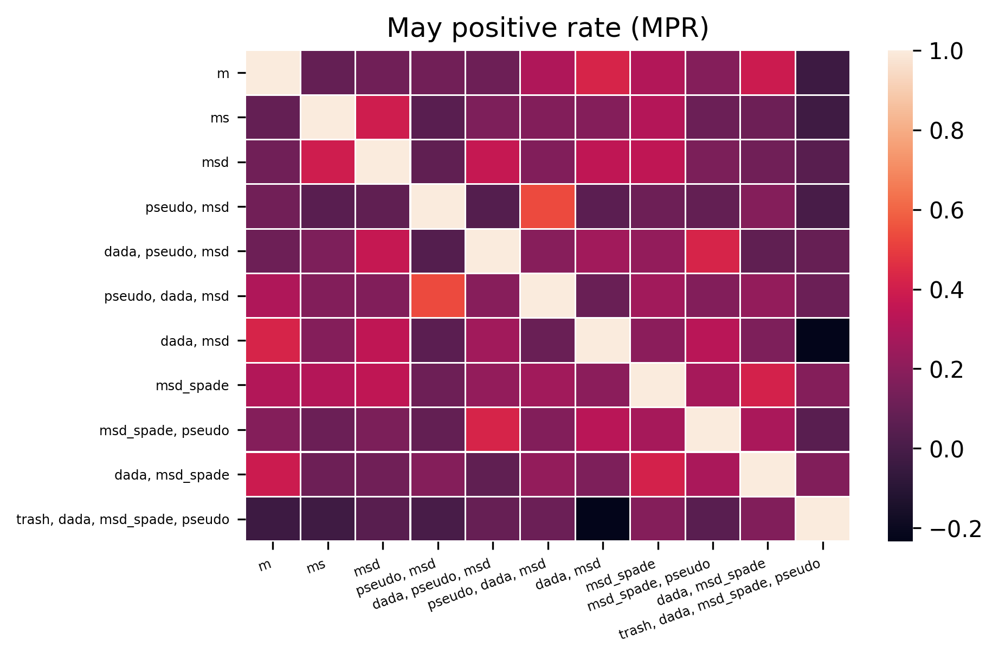

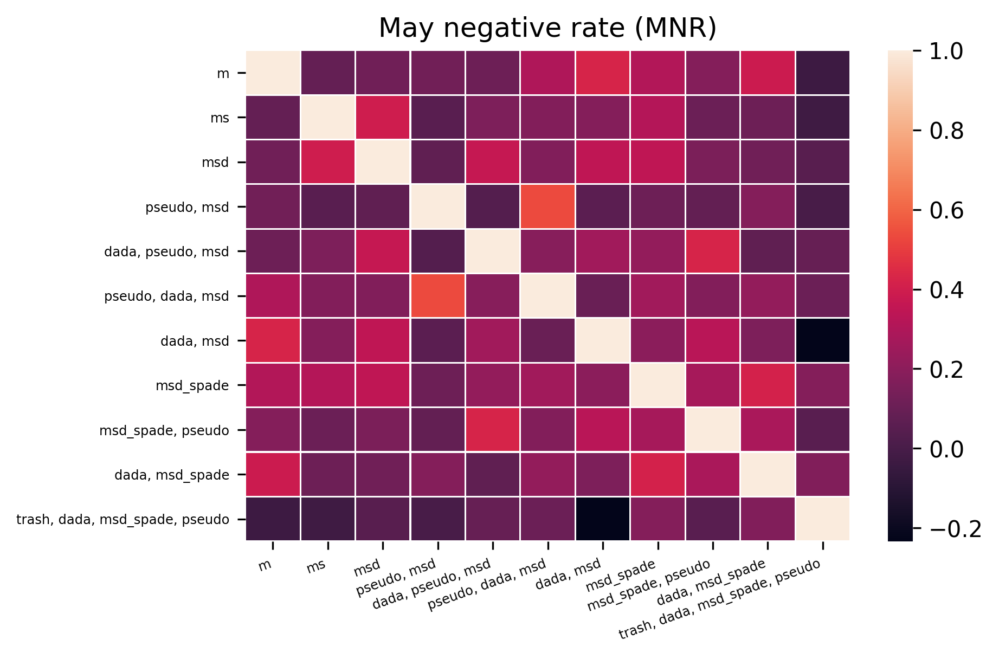

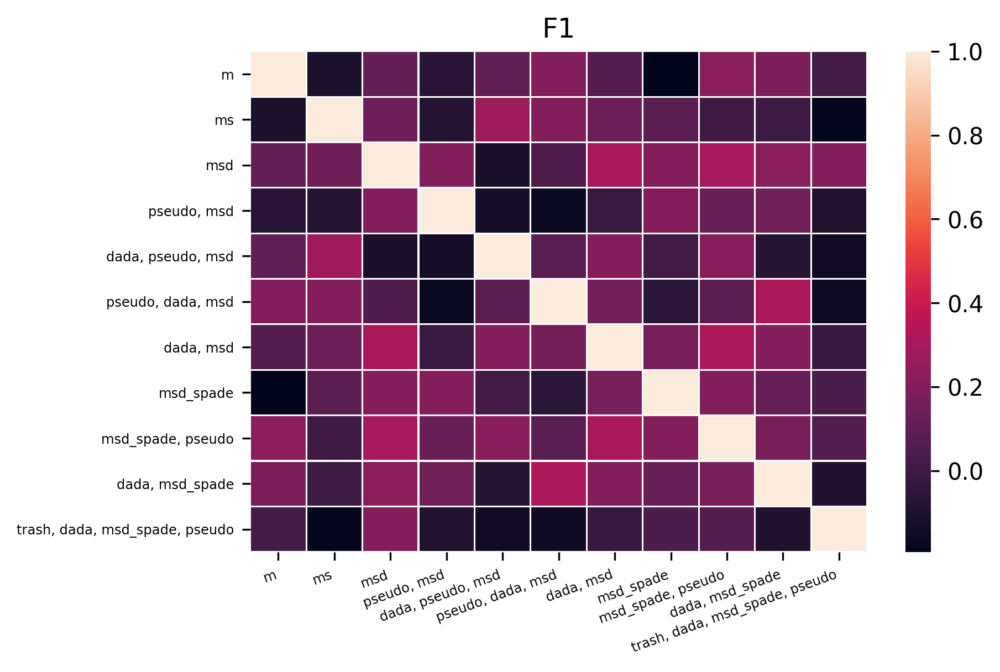

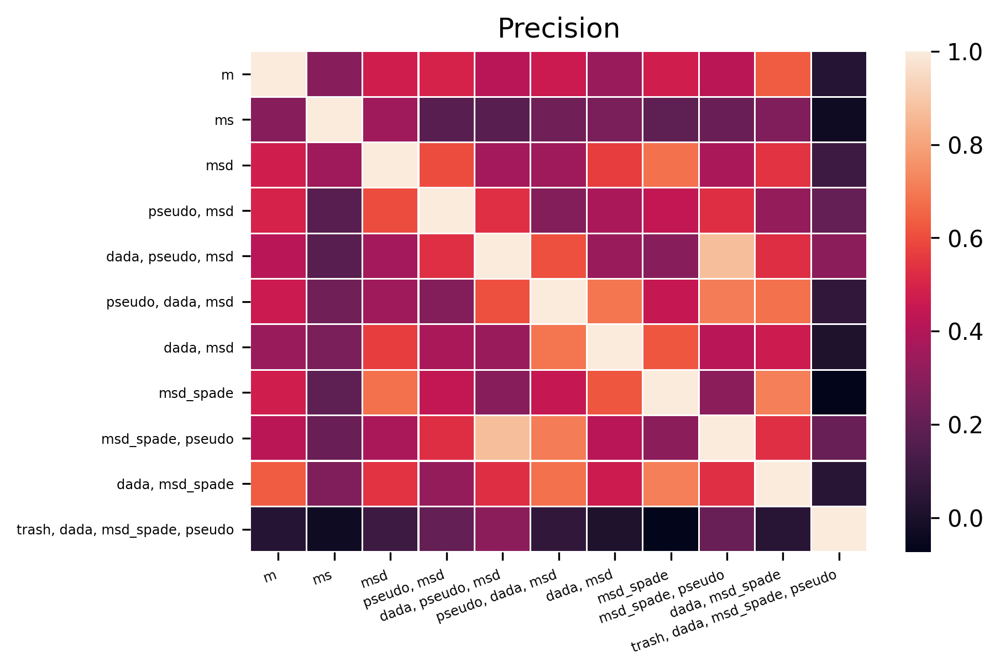

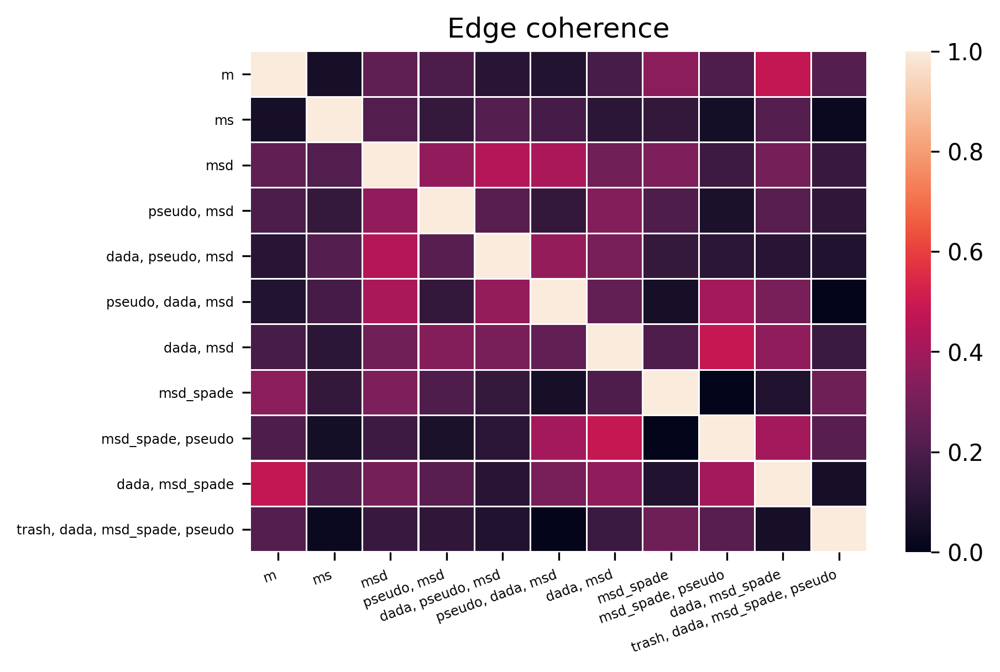

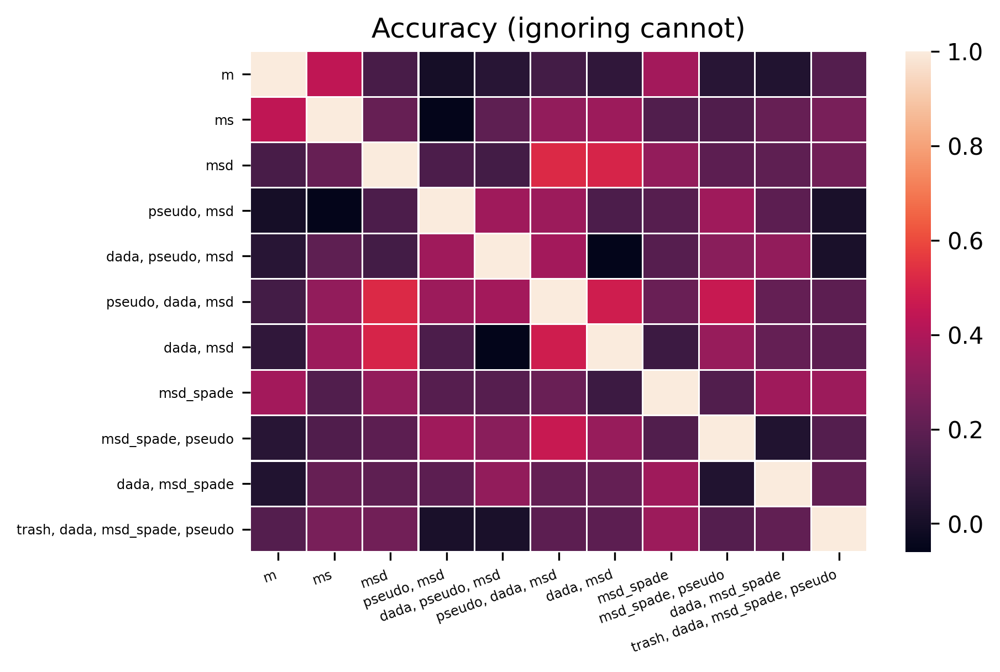

In [58]:
for metric in dict_kendall_mat.keys():
    heatmap_kendall(dict_kendall_mat, metric, dict_models.values())

# Playground

In [56]:
df

,idx,fpr,fnr,mnr,mpr,tpr,tnr,precision,f1,accuracy_must_may,edge_coherence,filename,model
0,0,0.000000,0.011309,0.834115,0.165885,0.988691,1.000000,1.000000,0.994313,0.922224,0.022213,007417_1.jpg,e84a8b06
1,1,0.008064,0.015866,0.535247,0.464753,0.984134,0.991936,0.983243,0.983688,0.866534,0.020105,007567_1.jpg,e84a8b06
2,2,0.000303,0.009482,0.577987,0.422013,0.990518,0.999697,0.999204,0.994842,0.898152,0.014964,007581_1.jpg,e84a8b06
3,3,0.005014,0.003687,0.664616,0.335384,0.996313,0.994986,0.992075,0.994190,0.955980,0.018490,007582_3.jpg,e84a8b06
4,4,0.000000,0.007156,0.508482,0.491518,0.992844,1.000000,1.000000,0.996409,0.775012,0.032354,007584_1.jpg,e84a8b06
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,95,0.004993,0.001286,0.299337,0.700663,0.998714,0.995007,0.982357,0.990468,0.824464,0.019180,ubHSgySsaD2kcJrVYKgxew.jpg,8051ea3a
1096,96,0.003956,0.000000,0.093806,0.906194,1.000000,0.996044,0.993211,0.996594,0.875969,0.019686,xeMkVLPzp4EkpCPFrDTSfA.jpg,8051ea3a
1097,97,0.000772,0.000452,0.493276,0.506724,0.999548,0.999228,0.998702,0.999125,0.928307,0.010167,yZUEyQZuMnnrGzWbDwbpaA.jpg,8051ea3a
1098,98,0.000000,0.001572,0.819036,0.180964,0.998428,1.000000,1.000000,0.999213,0.969460,0.008581,zbUjR0xNCXstCKTILH6s_w.jpg,8051ea3a
